In [1]:
import numpy as np
import pandas as pd
import scipy.stats as scs 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.formula.api import ols

C:\Users\isaka\AppData\Local\Temp\ipykernel_13804\3178615738.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


### Inlämningsuppgift - Statistiska Metoder AI23
---
# Diamonds

In [2]:
# Det givna datasettet. Länkar även till Kaggle-sidan jag antar den är tagen från. https://www.kaggle.com/datasets/shivam2503/diamonds
diamonds = pd.read_csv('diamonds.csv')

# Ersätter 0-värden (finns endast i x,y,z) med o.1. Detta för att kunna skapa en volym.
# diamonds.replace(0, 1, inplace=True)

# Tar bort de diamanter som har 0mm i x, y eller z och där med ingen volym.
diamonds = diamonds[diamonds['x'] > 0]
diamonds = diamonds[diamonds['y'] > 0]
diamonds = diamonds[diamonds['z'] > 0]

# Och tar bort de värsta outliers som inte det verkar som att det finns någon förklaring till i dokumentationen.
diamonds = diamonds[diamonds['x'] < 12]
diamonds = diamonds[diamonds['y'] < 12]
diamonds = diamonds[diamonds['z'] < 12]

# Lägger till en kolumn för volym
diamonds['volume'] = diamonds['x'] * diamonds['y'] * diamonds['z']

# Skapar en kolumn för rankning av 'cut', 'color' och 'clarity' då de är kategoriska variabler.
diamonds['cut_rank'] = diamonds['cut']
diamonds['cut_rank'].replace({'Fair': 5, 'Good': 4, 'Very Good': 3, 'Premium': 2, 'Ideal': 1}, inplace=True)

diamonds['color_rank'] = diamonds['color']
diamonds['color_rank'].replace({'J': 7, 'I': 6, 'H': 5, 'G': 4, 'F': 3, 'E': 2, 'D': 1}, inplace=True)

diamonds['clarity_rank'] = diamonds['clarity']
diamonds['clarity_rank'].replace({'I1': 8, 'SI2': 7, 'SI1': 6, 'VS2': 5, 'VS1': 4, 'VVS2': 3, 'VVS1': 2, 'IF': 1}, inplace=True)

diamonds.head()

C:\Users\isaka\AppData\Local\Temp\ipykernel_13804\2719105133.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  diamonds['cut_rank'].replace({'Fair': 5, 'Good': 4, 'Very Good': 3, 'Premium': 2, 'Ideal': 1}, inplace=True)
C:\Users\isaka\AppData\Local\Temp\ipykernel_13804\2719105133.py:22: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('fut

,carat,cut,color,clarity,depth,table,price,x,y,z,volume,cut_rank,color_rank,clarity_rank
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,38.202030,1,2,7
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,34.505856,2,2,6
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31,38.076885,4,2,4
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63,46.724580,2,6,5
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75,51.917250,4,7,7


<Axes: xlabel='volume', ylabel='price'>

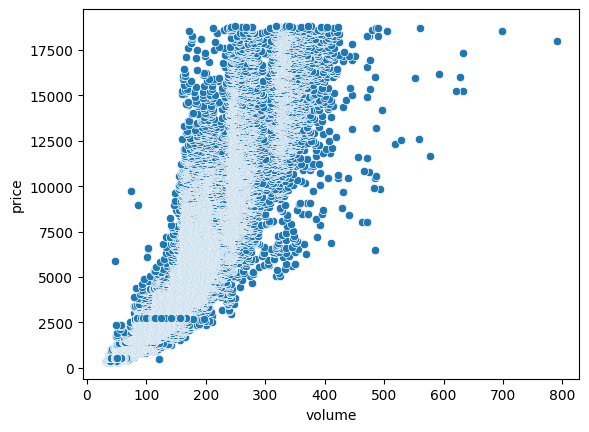

In [3]:
sns.scatterplot(x='volume', y='price', data=diamonds)

In [4]:
corr = diamonds[['carat','depth','table','price','x','y','z','volume']].corr()
corr

,carat,depth,table,price,x,y,z,volume
carat,1.000000,0.028357,0.181646,0.921586,0.977778,0.976860,0.976478,0.998941
depth,0.028357,1.000000,-0.295758,-0.010653,-0.024940,-0.028075,0.096741,0.011028
table,0.181646,-0.295758,1.000000,0.127241,0.196096,0.189942,0.155904,0.172287
price,0.921586,-0.010653,0.127241,1.000000,0.887221,0.888818,0.882107,0.923546
x,0.977778,-0.024940,0.196096,0.887221,1.000000,0.998657,0.991077,0.979078
y,0.976860,-0.028075,0.189942,0.888818,0.998657,1.000000,0.990730,0.978628
z,0.976478,0.096741,0.155904,0.882107,0.991077,0.990730,1.000000,0.976062
volume,0.998941,0.011028,0.172287,0.923546,0.979078,0.978628,0.976062,1.000000


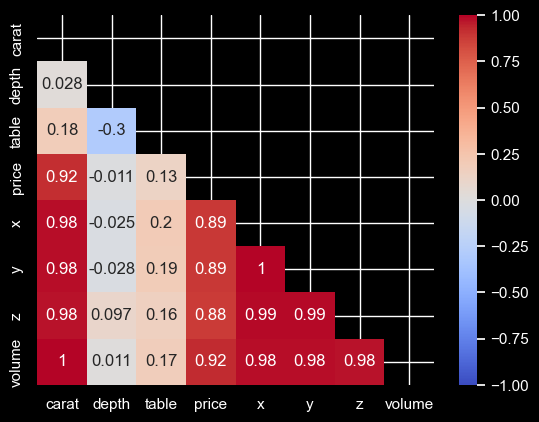

In [80]:
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, vmin=-1, vmax=1, cmap='coolwarm')
plt.style.use('dark_background')

In [ ]:
px.scatter(diamonds,
        x='volume',
        y='carat',
        color='cut',
        log_x=True,
        trendline='ols',
        title='Price vs Volume',
        labels={'volume':'Volume', 
                'price':'Price (USD)', 
                'clarity':'Clarity',
                'cut':'Cut',
                'color':'Color',
                'carat':'Carat',
                'depth':'Depth',},
        template='plotly_dark',
        hover_data=['carat', 
                'cut', 
                'color', 
                'depth', 
                'table', 
                'x', 'y', 'z',
                'cut_rank',
                'color_rank',
                'clarity_rank'],
        marginal_x='histogram',
        marginal_y='histogram')

c:\Users\isaka\.virtualenvs\StatMetAi23-Isak-Andersson-e2nV03pU\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

